# Temperature Forecast

- This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

- We have to Predict the Minimum and Maximum temperature for the next day.

- In this dataset we have following columns:-
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

In [2]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import joblib
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
from scipy.stats import zscore
from sklearn.preprocessing import power_transform
from sklearn.preprocessing import OrdinalEncoder
import warnings
warnings.filterwarnings('ignore')

In [3]:
#importing the dataset
df=pd.read_csv('temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [4]:
pd.set_option('display.max_columns', None)

In [5]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [6]:
df.shape   #checking te data dimensiion

(7752, 25)

In [7]:
df.columns   #checking the columns of the dataset

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [8]:
df.dtypes   #checking the data types of each column

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [9]:
#checking the null values in the dataset
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [10]:
for column in df.columns:
    df[column].fillna(df[column].mode()[0], inplace=True)

In [11]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,1.0,01-07-2013,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [12]:
#checking the null values in the dataset
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

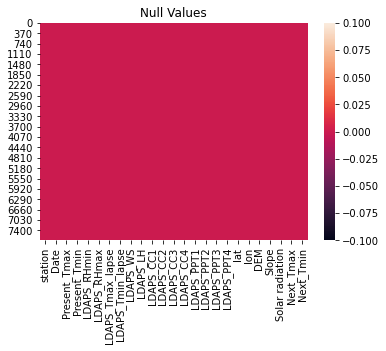

In [13]:
#checking the null values in dataset by using heatmap
sns.heatmap(df.isnull())
plt.title('Null Values')
plt.show()

- We can see that now there is no null values present in the  dataset.

### Visualization of the Data

<AxesSubplot:xlabel='Next_Tmax', ylabel='Density'>

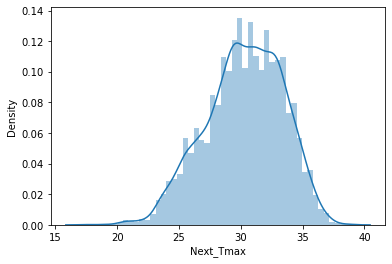

In [14]:
sns.distplot(df["Next_Tmax"])

- from the above graph we can see that the max temp of  next day is in range from  20-40

<AxesSubplot:xlabel='Next_Tmin', ylabel='Density'>

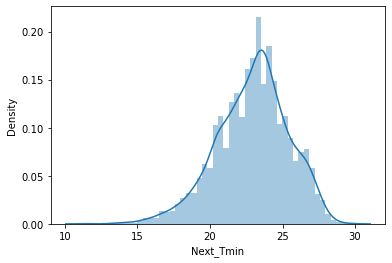

In [15]:
sns.distplot(df["Next_Tmin"])

- From the above graph we can see that the min temp of next day is in range from 13-30.

<AxesSubplot:xlabel='Present_Tmin', ylabel='Density'>

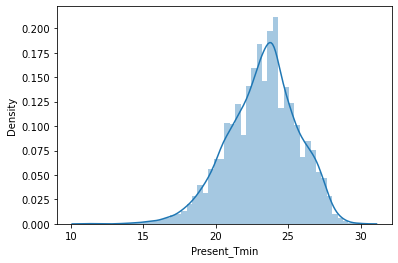

In [16]:
sns.distplot(df["Present_Tmin"])

- From the above graph we can see that the min temp of present day is in range from 15-30.

<AxesSubplot:xlabel='Present_Tmax', ylabel='Density'>

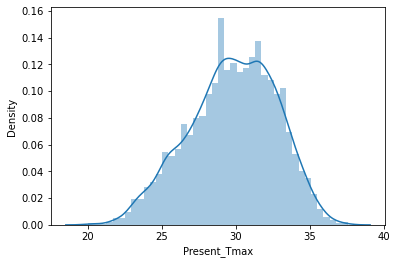

In [17]:
sns.distplot(df["Present_Tmax"])

- from the above graph we can see that the max temp of present day is in range from 20-37.

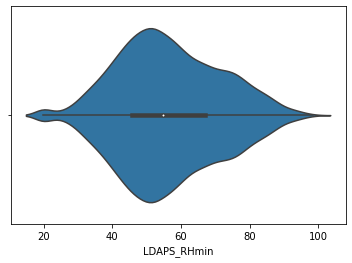

In [18]:
sns.violinplot(x= "LDAPS_RHmin", data=df)
plt.show()

- From theabove distribution we can observe that the minimum relative humidity for the next day is in range from 10-110.

- the majority of the mimimun relative humidity is in the range from 40-60.

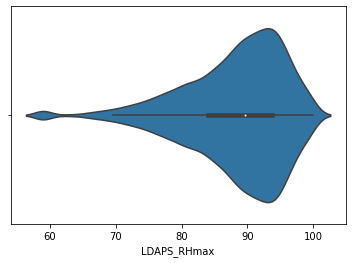

In [19]:
sns.violinplot(x= "LDAPS_RHmax", data=df)
plt.show()

- From theabove distribution we can observe that the maximum relative humidity for the next day is in range from 55-105.


- the majority of the maximum relative humidity is in the range from 80-100.

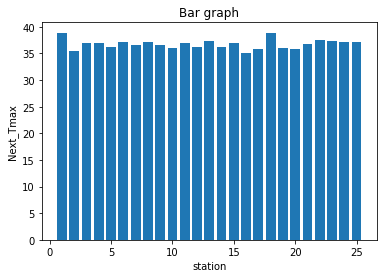

In [26]:
x=df['station']
y=df['Next_Tmax']
plt.bar(x, y)
plt.title('Bar graph')
plt.ylabel('Next_Tmax')
plt.xlabel('station')
plt.show()

- from the above graph we can see that at station 1 and station 2, the next day maximum temp goes highest.

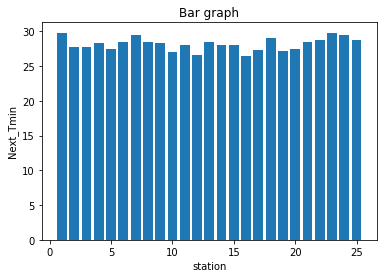

In [27]:
x=df['station']
y=df['Next_Tmin']
plt.bar(x, y)
plt.title('Bar graph')
plt.ylabel('Next_Tmin')
plt.xlabel('station')
plt.show()

- From the above graph we can see that at station 1, station 7 and station 23 have the highest next day minimum temp.

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Density'>

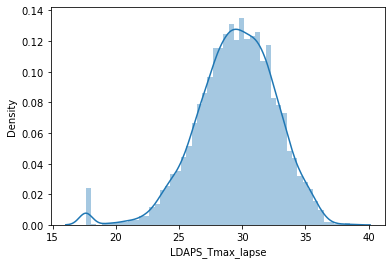

In [28]:
sns.distplot(df["LDAPS_Tmax_lapse"])

- from the above graph we can see that the next-day maximum air temperature is in range from 15-40.

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Density'>

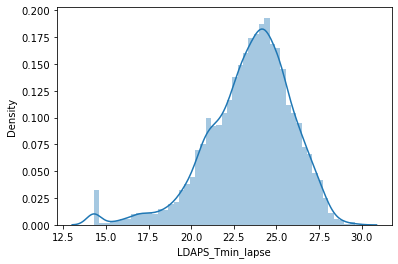

In [29]:
sns.distplot(df["LDAPS_Tmin_lapse"])

- from the above graph we can see that the next-day minimum air temperature is in range from 12.5-30.

<AxesSubplot:>

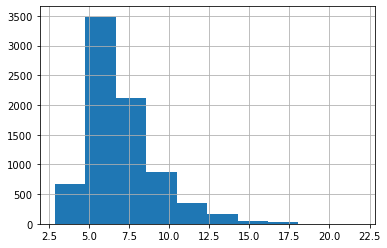

In [31]:
df.LDAPS_WS.hist()

- from the above graph we can see that the next-day average wind speed is in range from 3 to 17.5.

- majority of the next-day average wind speed is from 5.0 to 8.0.

<AxesSubplot:>

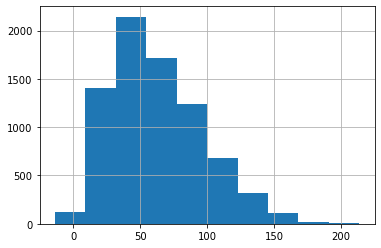

In [32]:
df.LDAPS_LH.hist()

- from the above graph we can see that the next-day average latent heat flux  is in range from 0 to 200.

- majority of the next-day average latent heat flux is from 10 to 100.

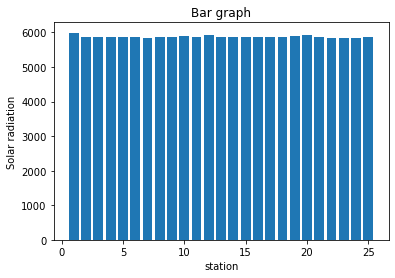

In [35]:
x=df['station']
y=df['Solar radiation']
plt.bar(x, y)
plt.title('Bar graph')
plt.ylabel('Solar radiation')
plt.xlabel('station')
plt.show()

- From the above graph we can observe that the solar radiation is almost similar in every station except station 1.

- Solar radiation is little bit high in station 1

In [37]:
df=df.drop('Date', axis=1)

- We can drop the Date column as it will not help us in predicting the next day minimum and maximum temp as the date will change everyday.

In [38]:
df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


array([[<AxesSubplot:title={'center':'station'}>,
        <AxesSubplot:title={'center':'Present_Tmax'}>,
        <AxesSubplot:title={'center':'Present_Tmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmax'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmax_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmin_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_WS'}>,
        <AxesSubplot:title={'center':'LDAPS_LH'}>],
       [<AxesSubplot:title={'center':'LDAPS_CC1'}>,
        <AxesSubplot:title={'center':'LDAPS_CC2'}>,
        <AxesSubplot:title={'center':'LDAPS_CC3'}>,
        <AxesSubplot:title={'center':'LDAPS_CC4'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT1'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT2'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT3'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT4'}>,
        <AxesSubplot:title={'center':'lat'}>],
       [<AxesSubplot:title={'center':'lon'}>

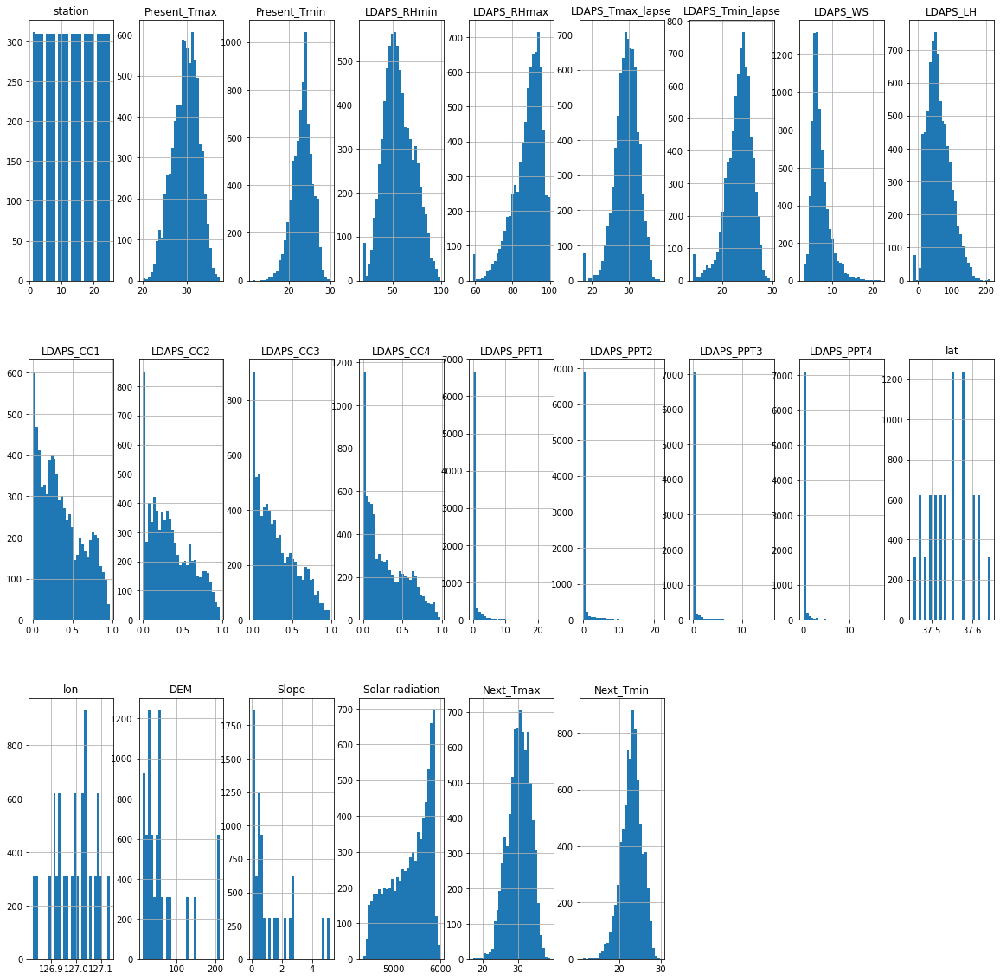

In [39]:
# 'Histogram to see the data distribution of all the columns'
df.hist(figsize=(20,20), grid = True, layout = (3,9), bins = 30)

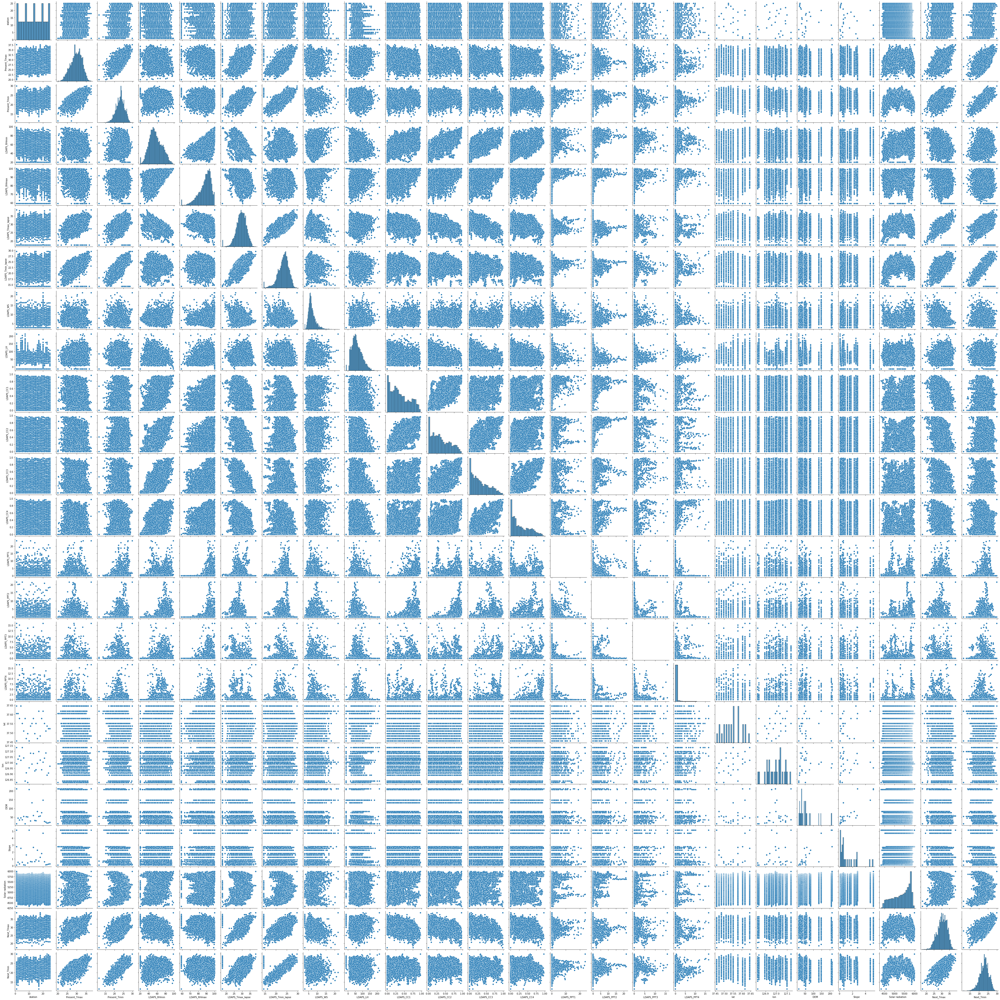

In [40]:
sns.pairplot(df)

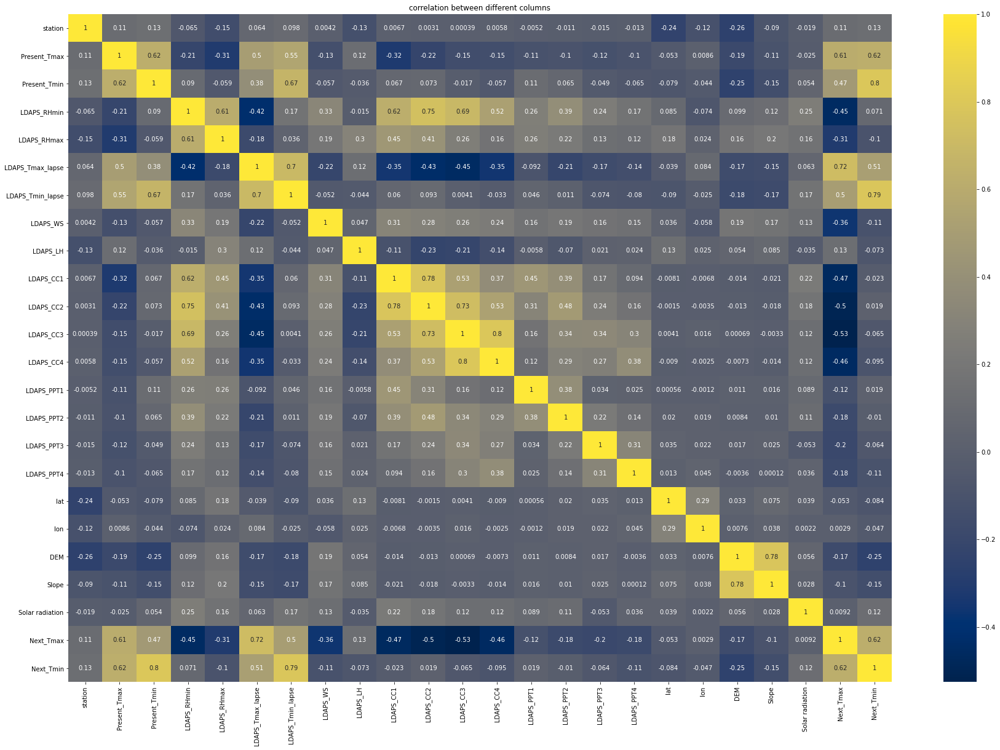

In [43]:
corr_df= df.corr()

plt.figure(figsize=[30,20])
sns.heatmap(corr_df,cmap="cividis",annot=True)
plt.title('correlation between different columns')
plt.show()

In [44]:
#defining corr between every column to the target column

corr_matrix=df.corr()
corr_matrix['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.723211
Next_Tmin           0.621018
Present_Tmax        0.608681
LDAPS_Tmin_lapse    0.503437
Present_Tmin        0.470941
LDAPS_LH            0.127318
station             0.108569
Solar radiation     0.009202
lon                 0.002946
lat                -0.053295
Slope              -0.102327
LDAPS_PPT1         -0.122410
DEM                -0.172171
LDAPS_PPT4         -0.181292
LDAPS_PPT2         -0.181683
LDAPS_PPT3         -0.197191
LDAPS_RHmax        -0.308550
LDAPS_WS           -0.359371
LDAPS_RHmin        -0.454425
LDAPS_CC4          -0.457305
LDAPS_CC1          -0.465100
LDAPS_CC2          -0.502816
LDAPS_CC3          -0.525956
Name: Next_Tmax, dtype: float64

- We can observe that 'LDAPS_Tmax_lapse' is most positive highly correlated column with the 'Next_Tmax' column.

- we can also observe that 'LDAPS_CC3' is the most negetive highly correlated column with the 'Next_Tmax' column.

In [45]:
#defining corr between every column to the target column

corr_matrix=df.corr()
corr_matrix['Next_Tmin'].sort_values(ascending=False)

Next_Tmin           1.000000
Present_Tmin        0.796333
LDAPS_Tmin_lapse    0.788360
Present_Tmax        0.621846
Next_Tmax           0.621018
LDAPS_Tmax_lapse    0.511372
station             0.128390
Solar radiation     0.119902
LDAPS_RHmin         0.070956
LDAPS_CC2           0.019174
LDAPS_PPT1          0.018670
LDAPS_PPT2         -0.010385
LDAPS_CC1          -0.022926
lon                -0.046522
LDAPS_PPT3         -0.064496
LDAPS_CC3          -0.065164
LDAPS_LH           -0.073270
lat                -0.083677
LDAPS_CC4          -0.094720
LDAPS_RHmax        -0.100040
LDAPS_PPT4         -0.105619
LDAPS_WS           -0.111450
Slope              -0.147148
DEM                -0.247130
Name: Next_Tmin, dtype: float64

- We can observe that 'Present_Tmin' is most positive highly correlated column with the 'Next_Tmin' column.

- we can also observe that 'DEM' is the most negetive highly correlated column with the 'Next_Tmin' column.

In [47]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.996904,29.782946,23.232056,56.401741,88.089988,29.497459,23.423193,7.057092,61.768678,0.365206,0.352635,0.315323,0.296297,0.586267,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.271491,22.934198
std,7.213213,2.960585,2.404154,15.038788,7.715499,3.158976,2.503109,2.212072,34.383864,0.263668,0.259164,0.251090,0.254803,1.937198,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.123085,2.483502
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.735368,84.038809,27.601014,22.032374,5.647741,36.776474,0.141643,0.136090,0.097389,0.077967,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,30.000000,23.400000,54.828714,89.699505,29.662273,23.735942,6.531345,56.487289,0.312156,0.309148,0.258831,0.224420,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.049122,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


- We can observe that their is high standard deviation in Solar radiation column. The data is highly distributed in this column.

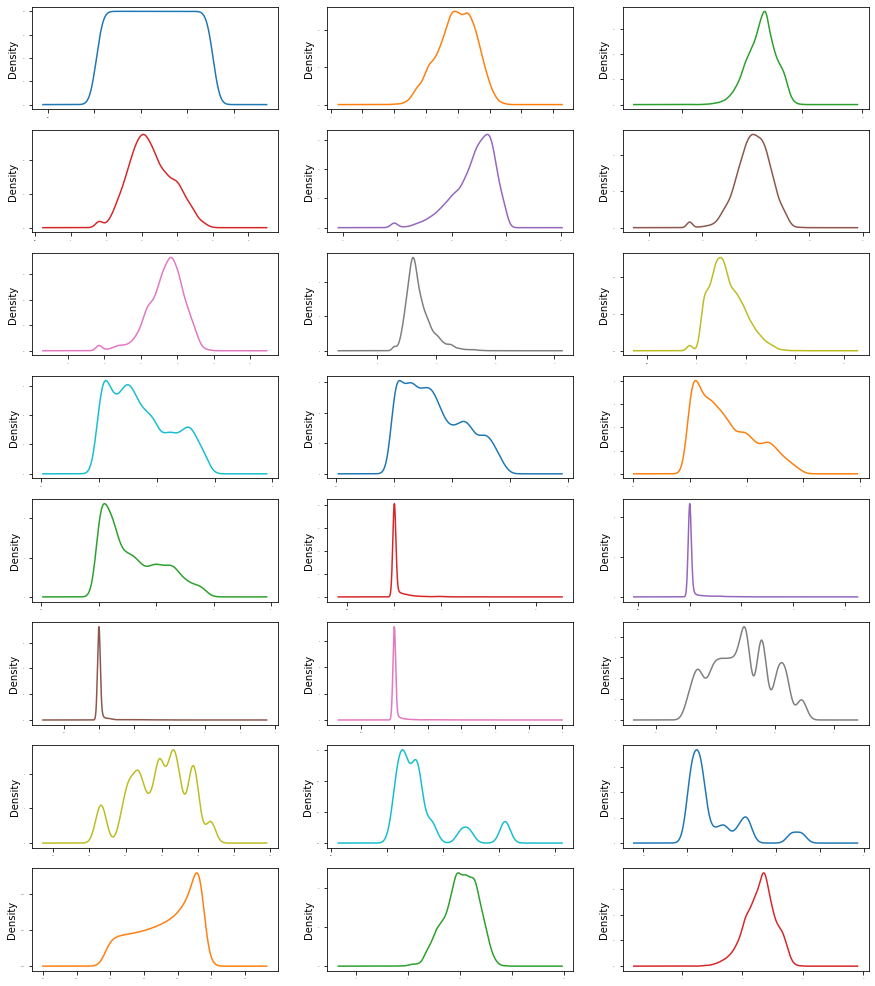

In [49]:
df.plot(kind='density',subplots=True,  layout=(9,3), sharex=False, legend=False, fontsize=1, figsize=(15,20))
plt.show()

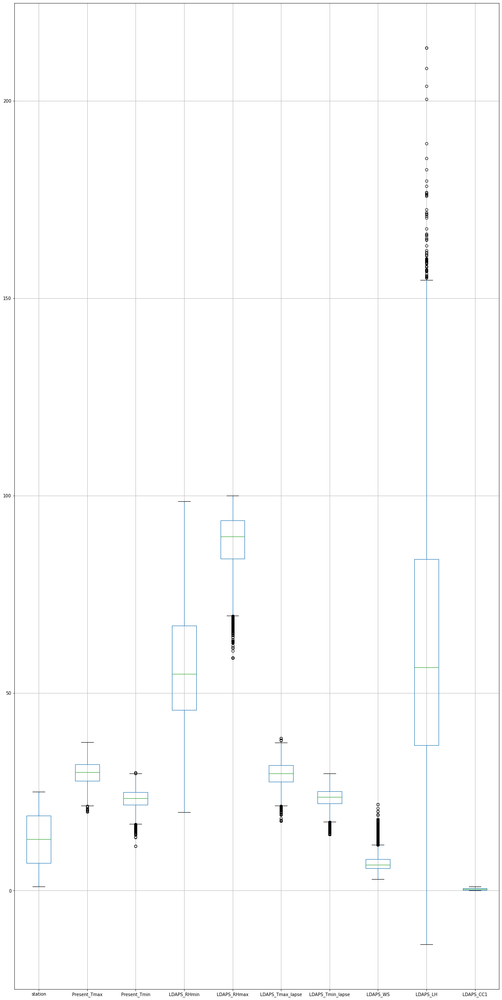

In [50]:
#checking the outliers
df.iloc[:,0:10].boxplot(figsize=[20,50])
plt.subplots_adjust(bottom=0.25)
plt.show()

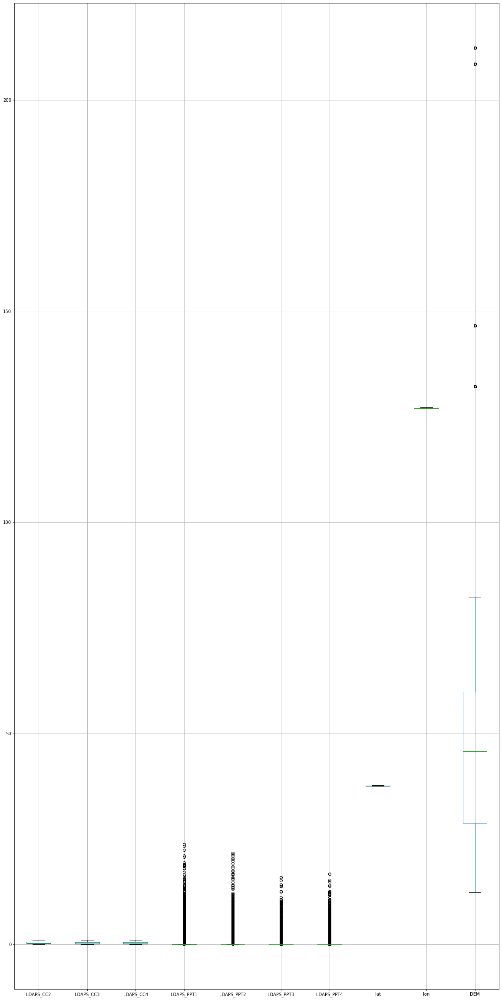

In [51]:
#checking the outliers
df.iloc[:,10:20].boxplot(figsize=[20,50])
plt.subplots_adjust(bottom=0.25)
plt.show()

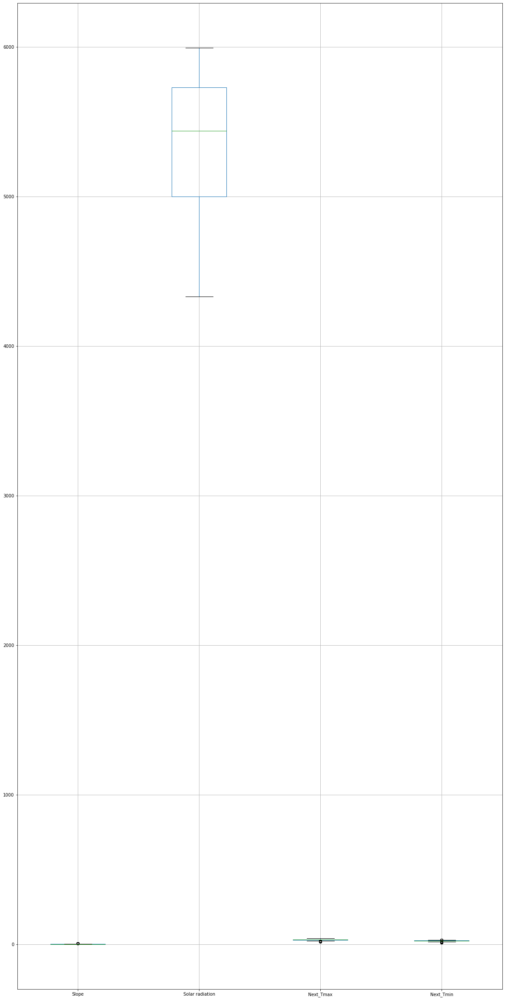

In [52]:
#checking the outliers
df.iloc[:,20:26].boxplot(figsize=[20,50])
plt.subplots_adjust(bottom=0.25)
plt.show()

- As we can see that their are outliers present in the dataset,So we have to remove it.

In [53]:
#checking the zscore of the dataset to remove the outliers
z=np.abs(zscore(df))
z

array([[1.66329184, 0.36581161, 0.76208695, ..., 1.51793488, 0.3751312 ,
        0.69833234],
       [1.52464842, 0.71512575, 0.67889224, ..., 1.22994952, 0.07317235,
        0.17484411],
       [1.38600499, 0.61378787, 0.02826281, ..., 1.21653443, 0.26530245,
        0.38891244],
       ...,
       [1.66415031, 2.2236727 , 2.42598117, ..., 2.0743251 , 0.79141307,
        2.22852871],
       [1.66329184, 3.30461006, 4.96341987, ..., 2.35821196, 4.12166806,
        4.68489656],
       [1.66329184, 2.64054542, 2.77368828, ..., 1.51793488, 2.76299368,
        2.76474364]])

In [54]:
threshold=3
print(np.where(z>3))

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int32), array([ 7, 14, 14, ..., 14, 15, 16], dtype=int32))


In [55]:
df_new=df[(z<3).all(axis=1)]  # removing outliers

In [56]:
df_new

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,1.616969e-01,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,1.594441e-01,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,2.040915e-01,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,1.611574e-01,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,1.788925e-01,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,0.000000e+00,0.004380,0.0,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,5.850000e-07,0.017678,0.0,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [57]:
df_new.shape

(6871, 24)

In [58]:
df_new.skew()

station             0.001119
Present_Tmax       -0.287674
Present_Tmin       -0.235534
LDAPS_RHmin         0.312825
LDAPS_RHmax        -0.734436
LDAPS_Tmax_lapse   -0.122127
LDAPS_Tmin_lapse   -0.422544
LDAPS_WS            1.093785
LDAPS_LH            0.574409
LDAPS_CC1           0.592419
LDAPS_CC2           0.501375
LDAPS_CC3           0.695673
LDAPS_CC4           0.711006
LDAPS_PPT1          3.739855
LDAPS_PPT2          4.860091
LDAPS_PPT3          5.490340
LDAPS_PPT4          5.950798
lat                 0.109504
lon                -0.272222
DEM                 1.766175
Slope               1.598954
Solar radiation    -0.517388
Next_Tmax          -0.269403
Next_Tmin          -0.248405
dtype: float64

- As we  can see their are skewness present  in the dataset, So we have to remove it.

In [72]:
#splitting the dataset into independent and target variables in x and y respectively

x=df_new.drop(['Next_Tmax','Next_Tmin'], axis=1)
y=df_new[['Next_Tmax', 'Next_Tmin']]

In [73]:
dfa=power_transform(x)

dfa=pd.DataFrame(dfa,columns=x.columns)

In [74]:
dfa

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.871948,-0.478845,-0.834333,0.264032,0.350521,-0.666465,-0.353961,0.173002,0.352658,-0.308124,-0.427523,-0.465584,-0.514189,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,-0.018727,1.854668,1.331921,1.883527
1,-1.659913,0.667944,-0.752437,-0.165814,0.263798,-0.030627,0.109583,-0.577003,-0.162752,-0.349308,-0.194349,-0.478801,-0.534349,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,0.505313,0.072418,-0.372205,1.425789
2,-1.466213,0.554627,-0.030572,-0.435311,-0.706706,0.056822,0.361012,-0.254970,-1.373527,-0.429801,-0.167650,-0.228054,-0.444917,-0.525012,-0.484532,-0.461665,-0.414564,0.679014,0.844014,-0.350802,-0.942503,1.405345
3,-1.285096,0.705985,0.013321,0.262925,1.376199,-0.083559,-0.213319,-0.609143,0.248916,-0.394539,-0.317843,-0.468743,-0.493445,-0.525012,-0.484532,-0.461665,-0.414564,2.012750,0.376371,0.101477,1.253523,1.382034
4,-1.113415,0.479753,-0.628395,0.117637,0.189082,-0.296433,-0.141581,-0.544253,1.296942,-0.736948,-0.202716,-0.366729,-0.280408,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,1.876941,-0.276153,-0.388761,1.391173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6866,1.074062,-2.161938,-2.198262,-2.630132,-1.342935,-0.758534,-2.097980,0.044758,-2.009779,-1.337076,-1.433293,-1.602734,-1.453995,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,0.608997,-0.710519,-0.265403,-1.758327
6867,1.192127,-2.318279,-2.336816,-2.057748,-0.742328,-1.144387,-2.245716,-0.519377,0.687204,-1.247864,-1.471066,-1.602729,-1.339542,-0.525012,-0.484532,-0.461665,-0.414564,-0.672497,1.214408,-0.997460,-1.353873,-1.775884
6868,1.308836,-2.108804,-2.439010,-2.405438,-1.282879,-1.265796,-1.949408,-0.247691,0.423645,-1.492880,-1.109118,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.128574,-1.246793,-1.575338,-1.278398,-1.774030
6869,1.424261,-2.108804,-2.233146,-2.703226,-1.434817,-1.038755,-1.962893,0.007656,-0.314908,-1.452437,-1.146384,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.399943,-1.030864,-1.395954,-1.067944,-1.780087


In [75]:
dfa.skew()

station            -0.202141
Present_Tmax       -0.033992
Present_Tmin       -0.022046
LDAPS_RHmin        -0.014338
LDAPS_RHmax        -0.106260
LDAPS_Tmax_lapse   -0.012192
LDAPS_Tmin_lapse   -0.026509
LDAPS_WS            0.007976
LDAPS_LH           -0.030516
LDAPS_CC1           0.065278
LDAPS_CC2           0.049796
LDAPS_CC3           0.093828
LDAPS_CC4           0.142622
LDAPS_PPT1          1.619109
LDAPS_PPT2          1.820632
LDAPS_PPT3          1.996731
LDAPS_PPT4          2.269057
lat                 0.092450
lon                -0.186117
DEM                 0.039220
Slope               0.234529
Solar radiation    -0.172551
dtype: float64

- We can see that skewness is removed from the dataset.

### Model Building

In [77]:
dfa

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.871948,-0.478845,-0.834333,0.264032,0.350521,-0.666465,-0.353961,0.173002,0.352658,-0.308124,-0.427523,-0.465584,-0.514189,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,-0.018727,1.854668,1.331921,1.883527
1,-1.659913,0.667944,-0.752437,-0.165814,0.263798,-0.030627,0.109583,-0.577003,-0.162752,-0.349308,-0.194349,-0.478801,-0.534349,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,0.505313,0.072418,-0.372205,1.425789
2,-1.466213,0.554627,-0.030572,-0.435311,-0.706706,0.056822,0.361012,-0.254970,-1.373527,-0.429801,-0.167650,-0.228054,-0.444917,-0.525012,-0.484532,-0.461665,-0.414564,0.679014,0.844014,-0.350802,-0.942503,1.405345
3,-1.285096,0.705985,0.013321,0.262925,1.376199,-0.083559,-0.213319,-0.609143,0.248916,-0.394539,-0.317843,-0.468743,-0.493445,-0.525012,-0.484532,-0.461665,-0.414564,2.012750,0.376371,0.101477,1.253523,1.382034
4,-1.113415,0.479753,-0.628395,0.117637,0.189082,-0.296433,-0.141581,-0.544253,1.296942,-0.736948,-0.202716,-0.366729,-0.280408,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,1.876941,-0.276153,-0.388761,1.391173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6866,1.074062,-2.161938,-2.198262,-2.630132,-1.342935,-0.758534,-2.097980,0.044758,-2.009779,-1.337076,-1.433293,-1.602734,-1.453995,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,0.608997,-0.710519,-0.265403,-1.758327
6867,1.192127,-2.318279,-2.336816,-2.057748,-0.742328,-1.144387,-2.245716,-0.519377,0.687204,-1.247864,-1.471066,-1.602729,-1.339542,-0.525012,-0.484532,-0.461665,-0.414564,-0.672497,1.214408,-0.997460,-1.353873,-1.775884
6868,1.308836,-2.108804,-2.439010,-2.405438,-1.282879,-1.265796,-1.949408,-0.247691,0.423645,-1.492880,-1.109118,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.128574,-1.246793,-1.575338,-1.278398,-1.774030
6869,1.424261,-2.108804,-2.233146,-2.703226,-1.434817,-1.038755,-1.962893,0.007656,-0.314908,-1.452437,-1.146384,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.399943,-1.030864,-1.395954,-1.067944,-1.780087


In [78]:
y

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7745,27.6,17.7
7746,28.0,17.1
7747,28.3,18.1
7748,28.6,18.8


In [79]:
x=dfa

In [80]:
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.871948,-0.478845,-0.834333,0.264032,0.350521,-0.666465,-0.353961,0.173002,0.352658,-0.308124,-0.427523,-0.465584,-0.514189,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,-0.018727,1.854668,1.331921,1.883527
1,-1.659913,0.667944,-0.752437,-0.165814,0.263798,-0.030627,0.109583,-0.577003,-0.162752,-0.349308,-0.194349,-0.478801,-0.534349,-0.525012,-0.484532,-0.461665,-0.414564,1.215234,0.505313,0.072418,-0.372205,1.425789
2,-1.466213,0.554627,-0.030572,-0.435311,-0.706706,0.056822,0.361012,-0.254970,-1.373527,-0.429801,-0.167650,-0.228054,-0.444917,-0.525012,-0.484532,-0.461665,-0.414564,0.679014,0.844014,-0.350802,-0.942503,1.405345
3,-1.285096,0.705985,0.013321,0.262925,1.376199,-0.083559,-0.213319,-0.609143,0.248916,-0.394539,-0.317843,-0.468743,-0.493445,-0.525012,-0.484532,-0.461665,-0.414564,2.012750,0.376371,0.101477,1.253523,1.382034
4,-1.113415,0.479753,-0.628395,0.117637,0.189082,-0.296433,-0.141581,-0.544253,1.296942,-0.736948,-0.202716,-0.366729,-0.280408,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,1.876941,-0.276153,-0.388761,1.391173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6866,1.074062,-2.161938,-2.198262,-2.630132,-1.342935,-0.758534,-2.097980,0.044758,-2.009779,-1.337076,-1.433293,-1.602734,-1.453995,-0.525012,-0.484532,-0.461665,-0.414564,0.142202,0.608997,-0.710519,-0.265403,-1.758327
6867,1.192127,-2.318279,-2.336816,-2.057748,-0.742328,-1.144387,-2.245716,-0.519377,0.687204,-1.247864,-1.471066,-1.602729,-1.339542,-0.525012,-0.484532,-0.461665,-0.414564,-0.672497,1.214408,-0.997460,-1.353873,-1.775884
6868,1.308836,-2.108804,-2.439010,-2.405438,-1.282879,-1.265796,-1.949408,-0.247691,0.423645,-1.492880,-1.109118,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.128574,-1.246793,-1.575338,-1.278398,-1.774030
6869,1.424261,-2.108804,-2.233146,-2.703226,-1.434817,-1.038755,-1.962893,0.007656,-0.314908,-1.452437,-1.146384,-1.602734,-1.492636,-0.525012,-0.484532,-0.461665,-0.414564,-0.399943,-1.030864,-1.395954,-1.067944,-1.780087


In [81]:
#checking the best random state
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i}, the training accuracy is:- {r2_score(y_train,pred_train)}")
    print(f"At random state {i}, the testing accuracy is:- {r2_score(y_test,pred_test)}")
    print("\n")

At random state 0, the training accuracy is:- 0.7891813427480706
At random state 0, the testing accuracy is:- 0.7893822890945026


At random state 1, the training accuracy is:- 0.7908298410605987
At random state 1, the testing accuracy is:- 0.78628355252212


At random state 2, the training accuracy is:- 0.7883024228407597
At random state 2, the testing accuracy is:- 0.7920801844628607


At random state 3, the training accuracy is:- 0.7917693123855523
At random state 3, the testing accuracy is:- 0.7837185411460963


At random state 4, the training accuracy is:- 0.7917454870253953
At random state 4, the testing accuracy is:- 0.7840186769037327


At random state 5, the training accuracy is:- 0.7891150667385549
At random state 5, the testing accuracy is:- 0.7905899122080983


At random state 6, the training accuracy is:- 0.7896665568276721
At random state 6, the testing accuracy is:- 0.788798307086835


At random state 7, the training accuracy is:- 0.7863981788633255
At random state 7, th

At random state 62, the training accuracy is:- 0.7886753364188746
At random state 62, the testing accuracy is:- 0.7912016422544834


At random state 63, the training accuracy is:- 0.7871649713231474
At random state 63, the testing accuracy is:- 0.7946701457608459


At random state 64, the training accuracy is:- 0.7894367195523697
At random state 64, the testing accuracy is:- 0.7895520224616339


At random state 65, the training accuracy is:- 0.7887862023107594
At random state 65, the testing accuracy is:- 0.7910750822261347


At random state 66, the training accuracy is:- 0.788165566370194
At random state 66, the testing accuracy is:- 0.7922015942892286


At random state 67, the training accuracy is:- 0.792624097293836
At random state 67, the testing accuracy is:- 0.7822180302668333


At random state 68, the training accuracy is:- 0.7881315653978013
At random state 68, the testing accuracy is:- 0.7924913491164409


At random state 69, the training accuracy is:- 0.7922073466852477
At ra

At random state 125, the training accuracy is:- 0.786770305723032
At random state 125, the testing accuracy is:- 0.7958273717027465


At random state 126, the training accuracy is:- 0.7873041656414177
At random state 126, the testing accuracy is:- 0.794488610980717


At random state 127, the training accuracy is:- 0.7969756439372278
At random state 127, the testing accuracy is:- 0.7710106681520161


At random state 128, the training accuracy is:- 0.7934509148675437
At random state 128, the testing accuracy is:- 0.7792980469918047


At random state 129, the training accuracy is:- 0.7895625381490579
At random state 129, the testing accuracy is:- 0.7894657215639502


At random state 130, the training accuracy is:- 0.7927243802756789
At random state 130, the testing accuracy is:- 0.7816672475627702


At random state 131, the training accuracy is:- 0.7868178419825824
At random state 131, the testing accuracy is:- 0.7953486157301626


At random state 132, the training accuracy is:- 0.7899885

At random state 188, the training accuracy is:- 0.7899851523285221
At random state 188, the testing accuracy is:- 0.788338679878402


At random state 189, the training accuracy is:- 0.7911389603300086
At random state 189, the testing accuracy is:- 0.7848564312252628


At random state 190, the training accuracy is:- 0.7868231407284771
At random state 190, the testing accuracy is:- 0.7954203935988672


At random state 191, the training accuracy is:- 0.7844795212898792
At random state 191, the testing accuracy is:- 0.8005231153236316


At random state 192, the training accuracy is:- 0.7896582773832692
At random state 192, the testing accuracy is:- 0.7883985800608957


At random state 193, the training accuracy is:- 0.7897529554646922
At random state 193, the testing accuracy is:- 0.7887441911195805


At random state 194, the training accuracy is:- 0.7844720668731009
At random state 194, the testing accuracy is:- 0.8009361787321114


At random state 195, the training accuracy is:- 0.788737

- From the above stats we can see that at random state 25, the testing accuracy and the training accuracy is highest.

- Testing the best Random State in different algorithms

In [82]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=25)

In [87]:
from sklearn.neighbors import KNeighborsRegressor

In [88]:
model=[LinearRegression(),RandomForestRegressor(),DecisionTreeRegressor(),KernelRidge(),KNeighborsRegressor()]

In [89]:
for n in model:
    n.fit(x_train,y_train)
    n.score(x_train,y_train)
    predm=n.predict(x_test)
    print('r2_score of',n,'is')
    print(r2_score(y_test,predm))
    print(mean_squared_error(y_test,predm))
    print(mean_absolute_error(y_test,predm))
    print('\n')

r2_score of LinearRegression() is
0.8029950798487899
1.484685154933239
0.9311829669521132


r2_score of RandomForestRegressor() is
0.8859338029221948
0.8497701469447121
0.6886309408341411


r2_score of DecisionTreeRegressor() is
0.7364899123106001
1.9483850630455866
1.0138700290979608


r2_score of KernelRidge() is
-97.84892884551525
735.788657077306
26.82575608211331


r2_score of KNeighborsRegressor() is
0.8457059593945032
1.1497147429679935
0.7994616876818601




- Now checking cross validation score to check whether our models are overfitted or underfitted.

In [90]:
scrli=cross_val_score(LinearRegression(),x,y,cv=5)
print('cross validation score of linear regression: ',scrli.mean())

cross validation score of linear regression:  0.7307701969468414


In [91]:
scrkr=cross_val_score(KernelRidge(),x,y,cv=5)
print('cross validation score of KrenelRidgeRegressor: ',scrkr.mean())

cross validation score of KrenelRidgeRegressor:  nan


In [94]:
scrrf=cross_val_score(RandomForestRegressor(),x,y, cv=5)
print('cross validation score of RandomForestregression: ',scrrf.mean())

cross validation score of RandomForestregression:  0.697888345504788


In [95]:
scrdtr=cross_val_score(DecisionTreeRegressor(),x,y, cv=5)
print('cross validation score of DecisionTreeregression: ',scrdtr.mean())

cross validation score of DecisionTreeregression:  0.4312109057709515


In [96]:
scrkn=cross_val_score(KNeighborsRegressor(),x,y, cv=5)
print('cross validation score of KNeighborsRegressor: ',scrkn.mean())

cross validation score of KNeighborsRegressor:  0.5732021511163514


- Minimum difference in r2_score and cross validation score is for LinearRegression. So it is our best model

- Doing GridSearchCV for getting best parameters

In [97]:
#creating parameter list to pass in GridSearchCV
parameters= {'fit_intercept': ['True','False'],
             'normalize': ['True','False'],
             'copy_X': ['True','False'],
             'n_jobs': np.arange(-5,5)}

In [98]:
GCV=GridSearchCV(LinearRegression(),parameters,cv=5)

In [99]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'copy_X': ['True', 'False'],
                         'fit_intercept': ['True', 'False'],
                         'n_jobs': array([-5, -4, -3, -2, -1,  0,  1,  2,  3,  4]),
                         'normalize': ['True', 'False']})

In [100]:
#getting the best parameters found by GridSearchCV
GCV.best_params_

{'copy_X': 'True', 'fit_intercept': 'True', 'n_jobs': -5, 'normalize': 'True'}

In [101]:
GCV_pred=GCV.best_estimator_.predict(x_test)

In [102]:
r2_score(GCV_pred,y_test)

0.7469891031499669

In [103]:
joblib.dump(GCV.best_estimator_,'TemperatureForecast.obj')

['TemperatureForecast.obj']

> Case Study:

- This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

- We have to Predict the Minimum and Maximum temperature for the next day.


> Findings:

- the max temp of next day is in range from 20-40.
- the min temp of next day is in range from 13-30.
- the min temp of present day is in range from 15-30.
- the max temp of present day is in range from 20-37.
-  the minimum relative humidity for the next day is in range from 10-110. The majority of the mimimun relative humidity is in the range from 40-60.
- the maximum relative humidity for the next day is in range from 55-105. The majority of the maximum relative humidity is in the range from 80-100.
- at station 1 and station 2, the next day maximum temp goes highest.
- at station 1, station 7 and station 23 have the highest next day minimum temp.
- the next-day maximum air temperature is in range from 15-40.
- the next-day minimum air temperature is in range from 12.5-30.
- the next-day average wind speed is in range from 3 to 17.5. Majority of the next-day average wind speed is from 5.0 to 8.0.
- the next-day average latent heat flux is in range from 0 to 200. Majority of the next-day average latent heat flux is from 10 to 100.
- the solar radiation is almost similar in every station except station 1. Solar radiation is little bit high in station 1.
- 'LDAPS_Tmax_lapse' is most positive highly correlated column with the 'Next_Tmax' column.
- 'LDAPS_CC3' is the most negetive highly correlated column with the 'Next_Tmax' column.
- 'Present_Tmin' is most positive highly correlated column with the 'Next_Tmin' column.
- 'DEM' is the most negetive highly correlated column with the 'Next_Tmin' column.


>Predictions:

-  At random state 25, the testing accuracy and the training accuracy is highest.
- The best r2_score is for RandomForest Regressor.
- Minimum difference in r2_score and cross validation score is for LinearRegression. So it is our best model.
- After doing hyperparameter tuning. we increase the score of our model from 73% to 75%.